In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from MTGA.MTGA import *

from MTGA.MTGAInstance import Instance
import MTGA.Generators as Generators
import MTGA.Mutators as Mutators
import MTGA.WeightGenerators as WeightGenerators
import MTGA.GeneMutators as GeneMutators
import Fixers as Fixers
import Evaluators as Evaluators

from MTGA.GeneVisualizer import GeneEvolutionRenderer
from Displayer import Displayer

from Utils import *


## Main Instance

In [3]:
instance = Instance("problems/p8.json",
    evaluator=Evaluators.CummulativeEvaluator(),
    mutator=Mutators.WalkMutator(),
    generator=Generators.TruncatedNormal(),
    fixer=Fixers.ChoiceFixer(),
    weight_generator=WeightGenerators.SoftmaxWeights(),
    gene_mutator=GeneMutators.Normal())

problem size 120
fire starts [30, 46, 32]
num teams 17
colors ['green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'yellow', 'green', 'yellow', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'yellow', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green'

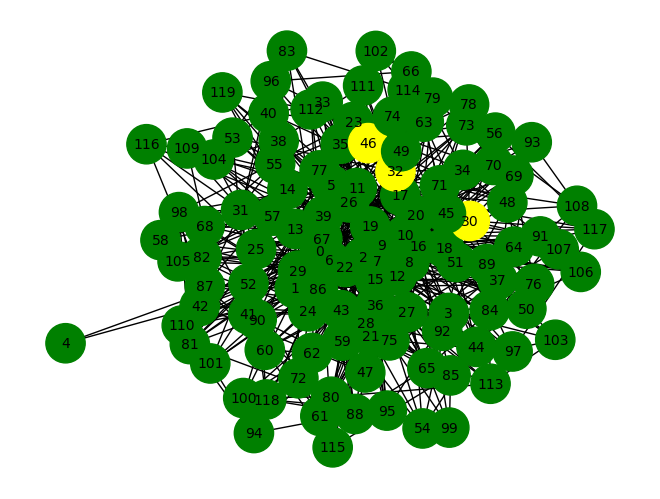

In [4]:
print("problem size", instance.size)
print("fire starts", instance.problem.fire_starts)
print("num teams", instance.problem.num_teams)
draw_graph(instance.problem.graph, instance.problem.fire_starts)

In [5]:
displayer = Displayer()
gene_displayer = GeneEvolutionRenderer()

## The Run

In [6]:
data = optimize_and_collect(instance)

[2025-02-05 23:32:22][  0]     0.12102199     0.12078762 { 70.00000000  78.47800000 201.00000000  15.26753143}
[2025-02-05 23:32:22][  1]     0.24664283     0.12401533 { 70.00000000  78.05800000 196.00000000  14.27118201}
[2025-02-05 23:32:22][  2]     0.36533022     0.11696339 { 70.00000000  78.00200000 195.00000000  12.01690459}
[2025-02-05 23:32:22][  3]     0.48099804     0.11274886 { 71.00000000  77.34600000 196.00000000   9.57592210}
[2025-02-05 23:32:22][  4]     0.58749843     0.10373092 { 70.00000000  77.75200000 200.00000000  12.39558373}
[2025-02-05 23:32:22][  5]     0.69864774     0.10960031 { 70.00000000  77.40800000 199.00000000  11.12787203}
[2025-02-05 23:32:22][  6]     0.80465198     0.10189772 { 70.00000000  77.82800000 199.00000000  12.21222404}
[2025-02-05 23:32:22][  7]     0.91470575     0.10857582 { 71.00000000  77.94000000 204.00000000  13.41865865}
[2025-02-05 23:32:22][  8]     1.02157736     0.10335755 { 70.00000000  78.27200000 199.00000000  14.21879095}
[

In [7]:
evaluator = Evaluators.MainEvaluator()
solutions = correct_solutions(instance, evaluator=evaluator)

## Results

In [8]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [1]:
[0, 7, 15, 16, 20, 29, 31, 36, 42, 50, 56, 59, 64, 81, 102, 107, 114]


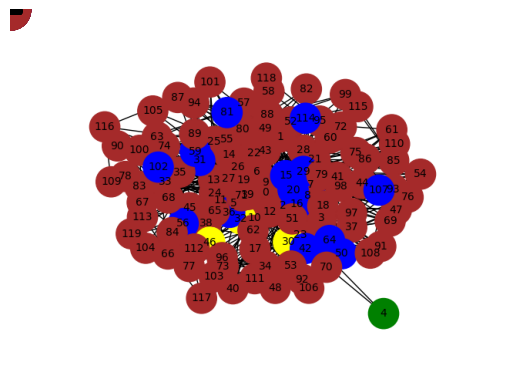

In [9]:
a = instance.problem.visualize_fire(displayer, best_solution)
a

In [19]:
instance.problem.visualize_fires(displayer, solutions)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x73a16529dda0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

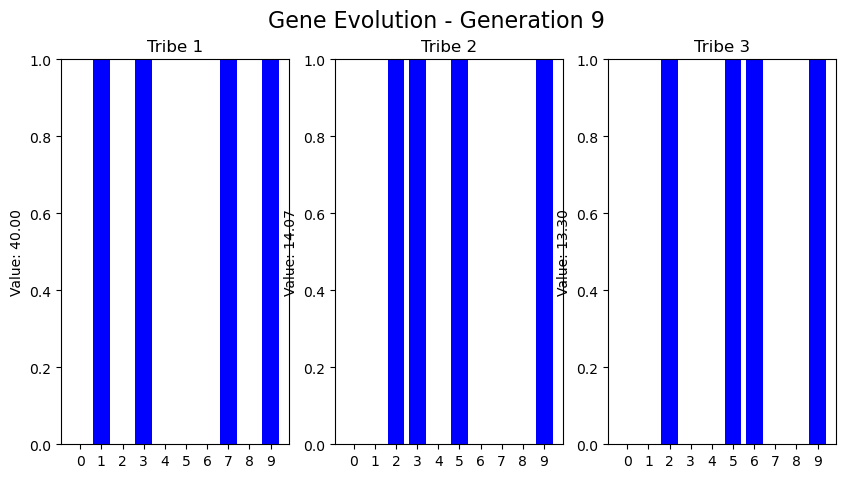

In [44]:
gene_displayer.visualize(data)

In [95]:
def collect_and_visualize(local_step_size):
    instance = Instance("problems/p1.json",
        evaluator=Evaluators.CummulativeEvaluator(),
        mutator=Mutators.WalkMutator(),
        generator=Generators.TruncatedNormal(),
        fixer=Fixers.ChoiceFixer(),
        weight_generator=WeightGenerators.SoftmaxWeights(),
        gene_mutator=GeneMutators.Normal(sigma=0.04))
    
    data = optimize_and_collect(instance,
                                tribe_number=4,
                                tribe_population=50,
                                number_of_iterations=200,
                                print_updates=False,
                                record_metrics=False,
                                local_step_size=local_step_size,
                                )
    print("data collected")
    visualize_gene_evolution(data)
    return gene_displayer.visualize(data)
    

data collected


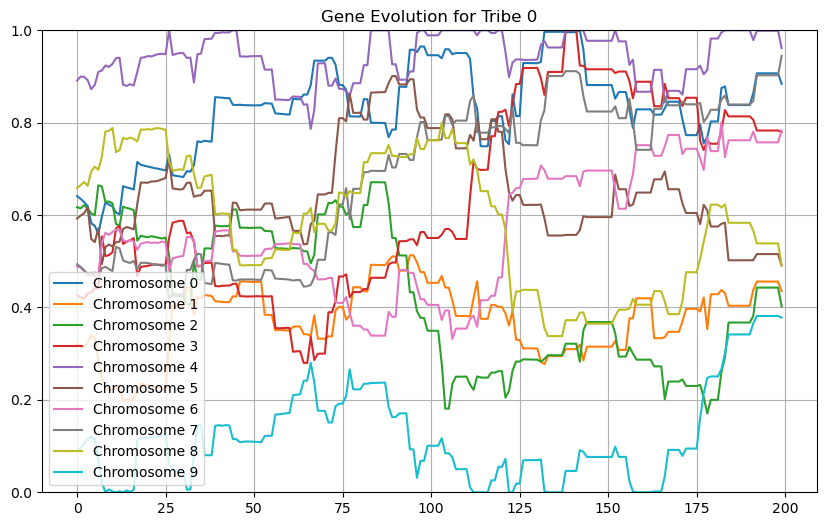

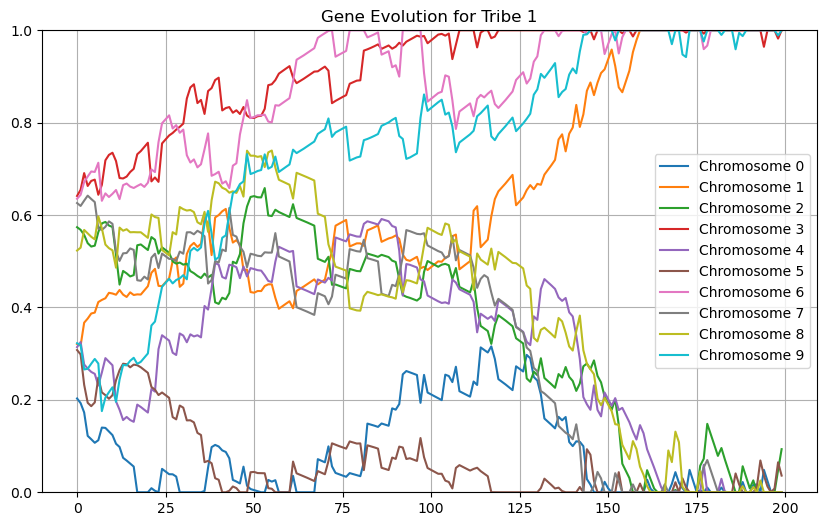

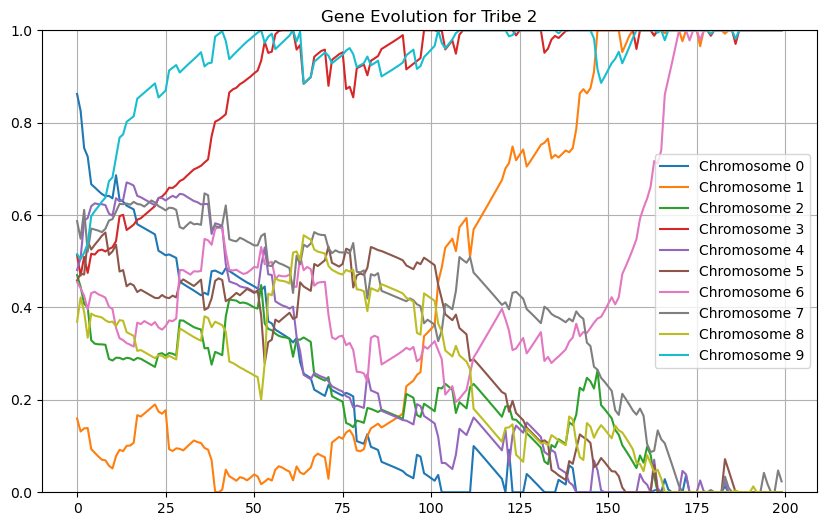

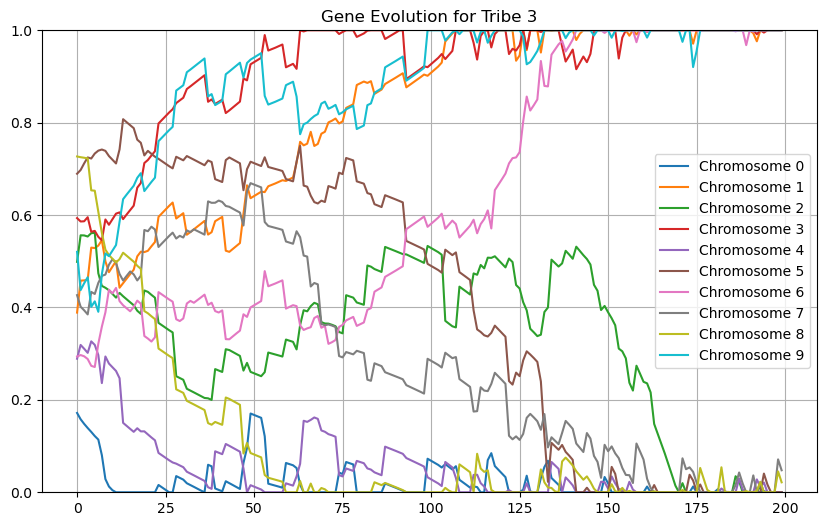

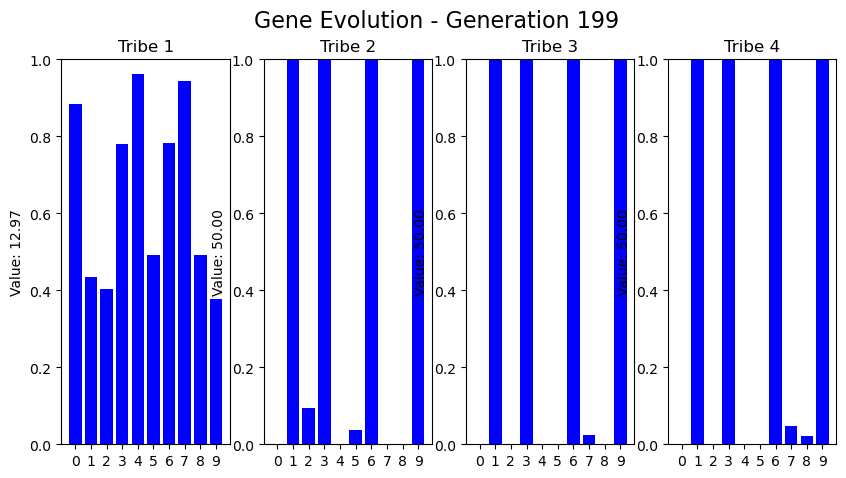

In [96]:
collect_and_visualize(0.03)

In [ ]:
instance

In [91]:
evaluator = Evaluators.MainEvaluator()
solutions = [ (np.where(bool_array)[0].tolist(), evaluator(instance.problem, bool_array)) for bool_array, _ in instance.solutions ]

## Results

In [92]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [5]:
[1, 3, 6, 9]
